# CS-141 HW2

In [8]:
import numpy as np 
import matplotlib.pyplot as plt
import cv2

# Autosave work 
%load_ext autoreload
%autoreload 2
%autosave 180

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Autosaving every 180 seconds



 The range in the x and y directions is (11,8) units 


 The initial position vector x = [ 9 -4] 

[[1098]
 [ 650]]


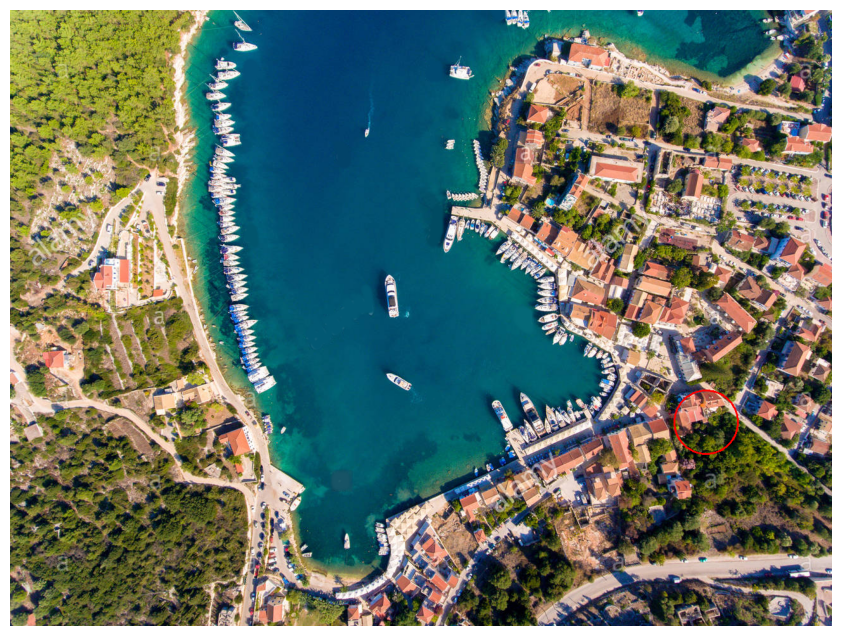

In [9]:
# Upload image of choice 
map = cv2.imread('BayMap.png')
# map = cv2.imread('CityMap.png')
# map = cv2.imread('MarioMap.png')
map = cv2.cvtColor(map, cv2.COLOR_BGR2RGB)

# Constants
m = 100  # images mxm pixels
dFOV = 100  # Field of view of the drone
sigma_movement = 5  # Movement from wind

# Calculate the range in the x and y directions
range_x = ((map.shape[1] - dFOV) // 2) // 50
range_y = ((map.shape[0] - dFOV) // 2) // 50
print(f'\n The range in the x and y directions is ({range_x},{range_y}) units \n')

# Simulate a drone's starting position x and y
pos_x = np.random.randint(-range_x, range_x + 1)
pos_y = np.random.randint(-range_y, range_y + 1)

state_ini = np.array([[pos_x], [pos_y]])
print(f'\n The initial position vector x = {state_ini.flatten()} \n')

# Convert unit position to pixel coordinates
center_x = int((pos_x) * 50 + (map.shape[1] // 2))
center_y = int((range_y+1 - pos_y) * 50)
ini_ref_pos = np.array([[center_x],[center_y]])
print(ini_ref_pos)

# Draw a circle with radius 50 pixels (1 unit)
radius_pixels = 50  # 1 unit = 50 pixels
cv2.circle(map, (center_x, center_y), radius_pixels, (255, 0, 0), 2)  # Red circle

# Show the image
plt.figure(figsize=(15, 8))
plt.imshow(map)
plt.axis("off")
plt.show()


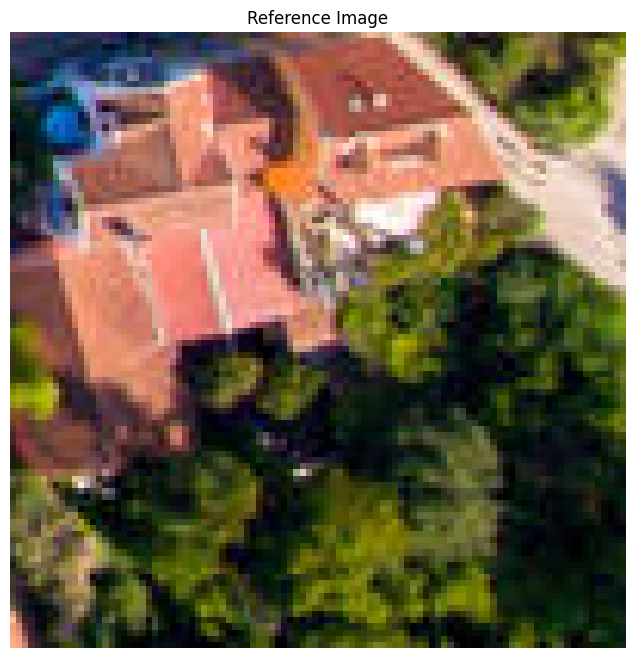

In [10]:
# Initial Pose 
# Re-initialize map
map = cv2.imread('BayMap.png')
map = cv2.cvtColor(map, cv2.COLOR_BGR2RGB)
hal = int(m/2)
ini_pos = map[center_y-hal:center_y+hal, center_x-hal:center_x+hal] #, height_s:height_e]

# Show the true position image
plt.figure(figsize=(15, 8))
plt.imshow(ini_pos)
plt.title("Reference Image")
plt.axis("off")
plt.show()

In [11]:
# Functions that can move the drone and particles
# Generate random movement in the x and y direction

def random_movement():
    """ Generates a random movement vector in the x and y direction, 
    such that dx^2 + dy^2 = 1.0
    Inputs: none
    Outputs: dx, dy
    """
    dx = np.random.uniform(-1, 1)
    posneg = np.random.choice([-1, 1])
    dy = (np.sqrt(1-dx**2))*posneg
    return dx,dy

def move_drone(pos,map, sigma_movement = 5):
    """ 
    Moves the drone a random distance dx, dy
    while checking to make sure it is in range of the map
    Inputs: Previous position, map
    OUtputs: new position 
    """
    dx,dy = random_movement()
    m = 100
    # print(dx)
    # print(dy)
    move_x = int(np.floor(dx*50)) + np.random.randn()*sigma_movement
    move_y = int(np.floor(dy*50)) + np.random.randn()*sigma_movement
    new_pos = pos + np.array([[move_x],[move_y]])

    while new_pos[0]+m/2 > (map.shape[1]) or new_pos[1]+m/2 > (map.shape[0]) or new_pos[0]-m/2 < (0) or new_pos[1]-m/2 < (0):
        print("Movement rejected, generating a new movement")
        dx,dy = random_movement()
        move_x = int(np.floor(dx*50)) + sigma_movement
        move_y = int(np.floor(dy*50)) + sigma_movement
        new_pos = pos + np.array([[move_x],[move_y]])
        # print(new_pos)

    return new_pos,dx,dy

def move_particle(pos,map, dx, dy, sigma_particle = 3):
    """ 
    Moves the drone a random distance dx, dy
    while checking to make sure it is in range of the map
    Inputs: Previous position, map
    OUtputs: new position 
    """
    # print(pos)
    move_x = int(np.floor(dx*50))
    # print(move_x)
    move_y = int(np.floor(dy*50))
    # print(move_y)
    new_pos = pos + np.array([[move_x],[move_y]])
    # print(new_pos)

    return new_pos

def im_comp(ref,particle,m):
    """ 
    Compares the view from a particle and compares 
    it to a reference image
    Inputs: Reference image, particle, pixels in each direction (m)
    Outputs: error associated with that particle
    Using ABSOLUTE ERROR APPROACH 
    """
    max_error = 10000000
    x = int(particle[0])
    y = int(particle[1])
    par_im = map[y:y+m,x:x+m]
    # Check if the extracted image has the required shape
    if par_im.shape != (100, 100, 3):
        # par_im = cv2.resize(par_im, (100, 100))
        return max_error  # Assign max error if shape is incorrect
        
    diff = cv2.absdiff(ref, par_im) # Absolute difference
    error = np.sum(diff) # Sum errors 
    
    return error

def low_variance_sampler(particles, weights):
    """
    Low variance resampling based on the particle weights.
    Parameters:
    particles (numpy.ndarray): Array of particle positions (N x 3)
    weights (numpy.ndarray): Normalized weights associated with each particle
    Returns:
    numpy.ndarray: Resampled array of particles
    FROM TEXTBOOK: Thrun, Burgard, Fox, page 86
    """
    N = len(particles)
    new_particles = np.zeros_like(particles)
    cumulative_sum = np.cumsum(weights)
    # print(cumulative_sum)
    
    # Start uniformly between 0 and 1/N
    start = np.random.uniform(0, 1 / N)
    index = 0  # Index of particles
    
    # Low variance saEmpling loop
    for i in range(N):
        u = start + i * (1 / N)
        while u > cumulative_sum[index]:
            index += 1
        new_particles[i] = particles[index]
        
    return new_particles

def GetScanRelation(BinsPerChannel, ref, particle):
    """ 
    Generates a 3D color histogram comparison of the reference image and particle image.
    
    Inputs: BinsPerChannel: Number of bins per channel for histogram calculation
        ref: Reference image
        particle: Particle position as an array containing (x, y)
    
    Output: Correlation score between the reference and particle image histogram
    """
    # Extract particle position
    x = int(particle[0])
    y = int(particle[1])
    
    # Define the size of the patch to extract
    m = 100  # Size of the patch (100x100)
    
    # Ensure the extracted area is within bounds
    if (y >= m // 2 and y <= map.shape[0] - m // 2) and (x >= m // 2 and x <= map.shape[1] - m // 2):
        # Extract the image patch from the map
        par_im = map[y - m // 2:y + m // 2, x - m // 2:x + m // 2]
        # print("PAR IMAGE", par_im)
        # print("\n REF \n", ref)
        # Calculate histograms
        histref = cv2.calcHist([ref], [0, 1, 2], None, [BinsPerChannel, BinsPerChannel, BinsPerChannel],
                                [0, 256, 0, 256, 0, 256])
        histp = cv2.calcHist([par_im], [0, 1, 2], None, [BinsPerChannel, BinsPerChannel, BinsPerChannel],
                              [0, 256, 0, 256, 0, 256])

        # Normalize histograms
        histref = cv2.normalize(histref, histref).flatten()
        histp = cv2.normalize(histp, histp).flatten()

        # Return the correlation between the two histograms
        return cv2.compareHist(histref, histp, cv2.HISTCMP_CORREL)
    else:
        # If the particle position is out of bounds, return a default value (e.g., 0 or max correlation)
        return 0

def abs_avg_dev(pos_arr, drone_pos):
    """ 
    Calculates the absolute average deviation of a pos array of particle 
    Inputs: Array of particle positions, drone position 
    Outputs: absolute average deviation 
    """
    absdev = 0
    N = len(pos_arr)
    for i in range(N):
        p = pos_arr[i,1:].reshape(2,1)
        # print(p)
        # print(drone_pos)
        x_dif = p[0] - drone_pos[0]
        y_dif = p[1] - drone_pos[1]
        dev = np.sqrt(x_dif**2 + y_dif**2)
        dev_w = 1/N * dev
        absdev += dev_w
        
    return absdev
        
        


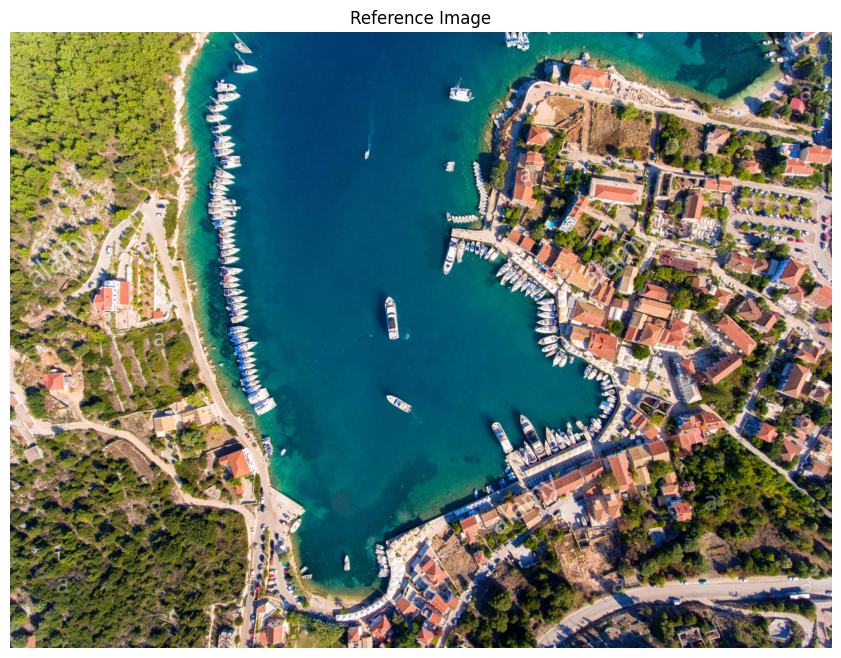

(10000, 3)


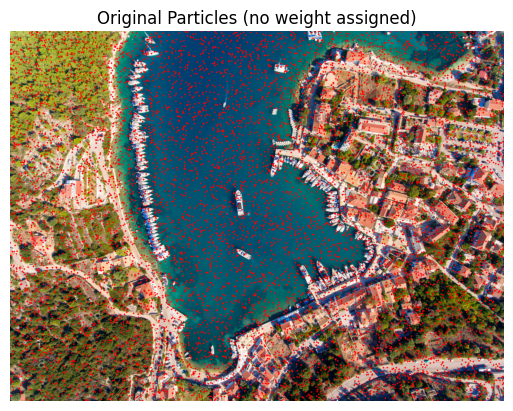

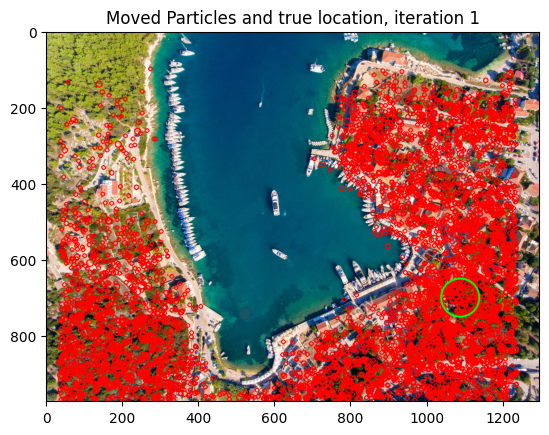

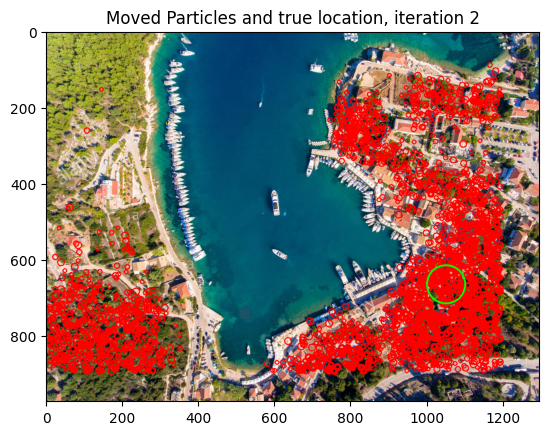

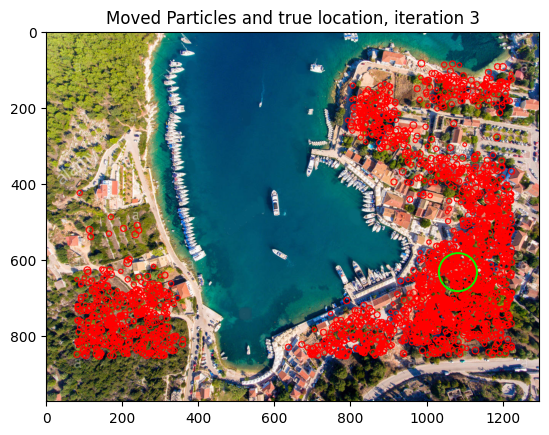

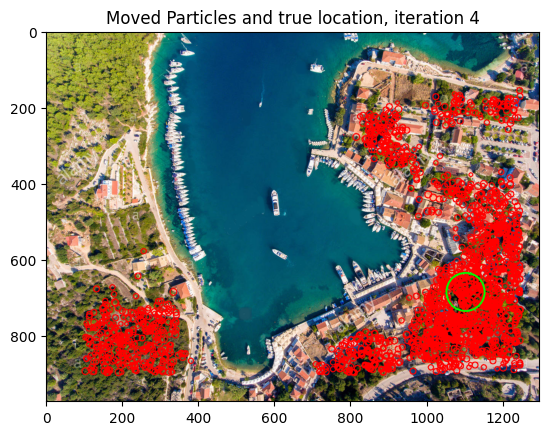

...

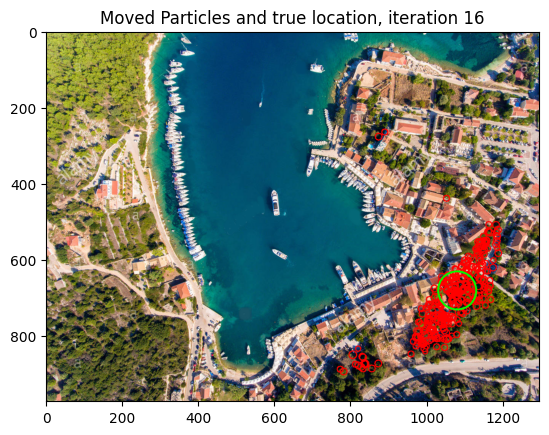

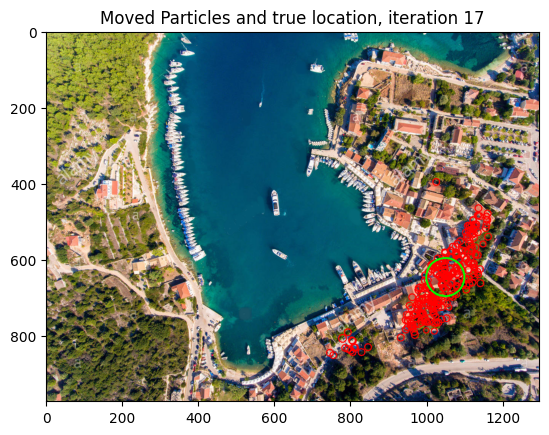

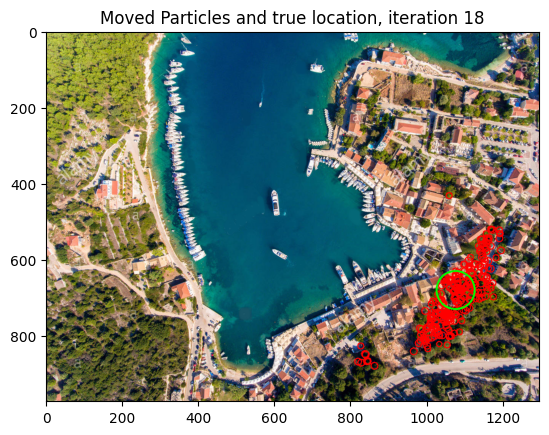

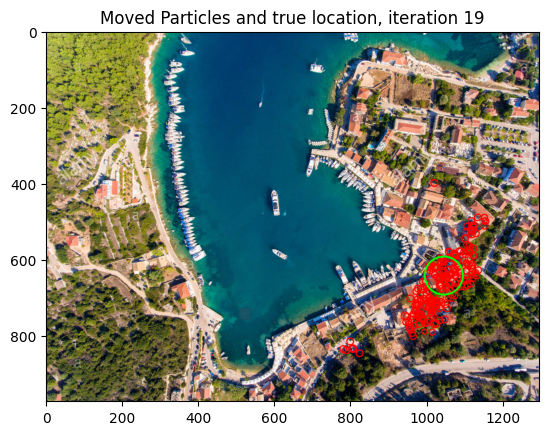

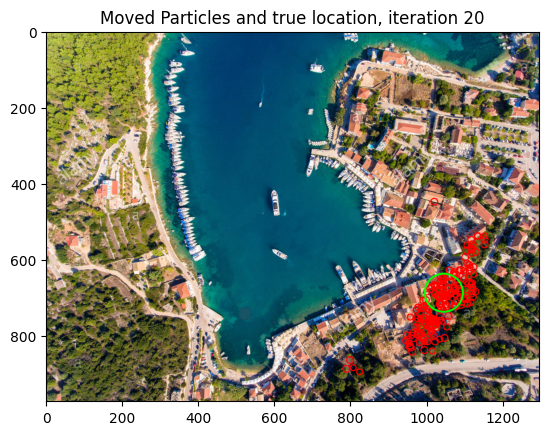

[393.99244073 283.89810657 210.40509583 171.50223959 139.13244934
 115.00721373 104.86797161  86.48258137  65.65909728  56.19970836
  48.65381625  41.3935809   37.42186213  34.54728514  29.91947693
  26.71628123  27.84053188  27.38087249  22.8296358   21.47622163]


In [12]:
# Particle filter implementation
# Re-initialize map
dispmap = map.copy()

N = 100 #N*N particles, subject to change

# Generate a set P of N particles, randomly distributed across the map 
particlePosArr = np.zeros([N**2, 3])  # particle number, xpos, ypos

for particleCount in range(N**2):
    # Random x and y positions within the map, adjusted to stay within the FOV
    x_pos = np.random.uniform(0, map.shape[1])# - dFOV)
    y_pos = np.random.uniform(0, map.shape[0])# - dFOV)
    particlePosArr[particleCount, :] = [particleCount, x_pos, y_pos]
    
    # Draw the particle on the map image
    cv2.circle(dispmap, (int(x_pos), int(y_pos)), 2, (255, 0, 0), -1)  # Red circles for particles

print(particlePosArr.shape)
# print(particlePosArr[:,1])

# Display the map with particles
plt.imshow(dispmap)
plt.title('Original Particles (no weight assigned)')
plt.axis('off')  # Turn off the axis
plt.show()

# Set number of iterations to use with particle fiter 

iterations = 20
max_pixel_value = 255
num_pixels = ini_pos.size  # total number of pixels
max_error = max_pixel_value * num_pixels/2
BinsPerChannel = 8
# max_pixel_value = 255
# num_pixels = ini_pos.size  # total number of pixels
# max_error = max_pixel_value * num_pixels
# print(max_error)

# Loop through each iteration 
ref_pos_pic = ini_pos
ref_pos = ini_ref_pos
devs = np.array([])
for i in range(iterations):
    errors = []
    # First, create an image for each particle 
    for p in range(len(particlePosArr)):
        particle = particlePosArr[p,1:]
        error = GetScanRelation(BinsPerChannel, ref_pos_pic, particle)  # Use GetScanRelation for comparison
        error = error**2
        errors.append(error)
        # error = im_comp(ref_pos_pic, particle, m=100) # COMPARE IMAGES
        # errors.append(error)
    weights = np.array(errors)
    # weights = weights**2
    # # epsilon = 1e-10
    # weights_i = 1 / (weights + epsilon) # Invert the weights
    # print(weights_i)
    weights_n = weights / np.sum(weights) # Normalize inverted weights 
    # print(weights_i_n)
    
    

    
    # # Resample particles
    # num_particles = len(weights)
    # indices = np.random.choice(range(num_particles), size=num_particles, p=weights_n)
    # # Select the particles that correspond to the resampled indices
    # resampled_particles = particlePosArr[indices]
    # # Adding small perturbations around resampled particles
    # for q, particle in enumerate(resampled_particles):
    #     # Adding jitter to x and y positions for the new particle distribution
    #     jitter_x = np.random.normal(0, 5)  # Adjust the standard deviation as needed
    #     jitter_y = np.random.normal(0, 5)
    #     particle[1] += jitter_x  # Adjust x position
    #     particle[2] += jitter_y  # Adjust y position
    # particlePosArr = resampled_particles
    # # print(particlePosArr)
    # OR USE LOW VARIANCE SAMPLER
    particlePosArr = low_variance_sampler(particlePosArr, weights_n)

    
    map_with_particles = map.copy()
    scaled_weights = weights_n / weights_n.max()  # Scale to [0, 1] range for visibility
    
    for r, particle in enumerate(particlePosArr):
        x = int(particle[1])  # x position
        y = int(particle[2])  # y position
        size = int(5 + scaled_weights[r] * 5)  # Scale size based on weight, adjust as needed
        # cv2.circle(map_with_particles, (x, y), size, (255, 0, 0), 2)  # Draw filled circle in red
    # plt.imshow(map_with_particles)
    # plt.title(f'Resampled Particles, iteration {i+1}')
    # plt.show()

    
    map_with_particles = map.copy()
    # Now, move the particles and the reference image
    new_pos_drone,dx,dy = move_drone(ref_pos,map, sigma_movement = 5) # Move the drone, get dx, dy (DRONE WILL HAVE NOISE 
    ref_pos = new_pos_drone
    
    # Show the new position of the drone as a reference 
    mapdrone = map.copy()
    center_x = int(ref_pos[0])
    center_y = int(ref_pos[1])
    # print(center_x)
    # print(center_y)
    # Draw a circle with radius 50 pixels (1 unit)
    radius_pixels = 50  # 1 unit = 50 pixels
    cv2.circle(mapdrone, (center_x, center_y), radius_pixels, (255, 0, 0), 4)  # Red circle
    # plt.imshow(mapdrone)
    # plt.title(f'Drone location, iteration {i+1}')
    # plt.show()
    # Create new reference pic based on the moved drone 
    ref_pos_pic = map[center_y-hal:center_y+hal, center_x-hal:center_x+hal]
    # print(ref_pos_pic.shape)

    
    for k in range(len(particlePosArr)):
        p = particlePosArr[k,1:].reshape(2,1)
        new_pose_p = move_particle(p,map,dx,dy, sigma_particle=3)
        x = int(new_pose_p[0])  # x position
        y = int(new_pose_p[1])  # y position
        new_pose_p = new_pose_p.reshape(1,2)
        particlePosArr[k,1:] = new_pose_p
        size = int(5 + scaled_weights[k] * 5)
        cv2.circle(map_with_particles, (x, y), size, (255, 0, 0), 2)  # Draw filled circle in red

    
    cv2.circle(map_with_particles, (center_x, center_y), radius_pixels, (0, 255, 0), 4)  # GREEN circle
    plt.imshow(map_with_particles)
    plt.title(f'Moved Particles and true location, iteration {i+1}')
    plt.show()

    # Calculate absolute average deviation
    absdev = abs_avg_dev(particlePosArr, ref_pos)
    # print(absdev)
    devs = np.append(devs, absdev)
    # print(devs)

print(devs)

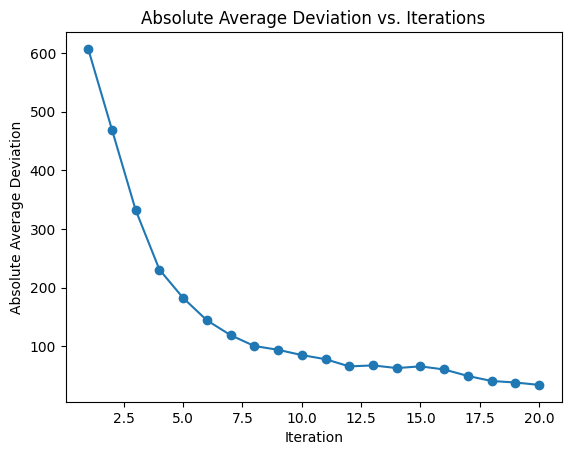

In [7]:
# Plot absolute average deviation vs iterations
plt.plot(range(1, iterations + 1), devs, marker='o', linestyle='-')
plt.xlabel("Iteration")
plt.ylabel("Absolute Average Deviation")
plt.title("Absolute Average Deviation vs. Iterations")
plt.grid(False)
plt.show()